<a href="https://colab.research.google.com/github/albivaltzew/urbancode_samolet/blob/main/urbancode_ann_visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import cv2
from google.colab.patches import cv2_imshow
# Load the image
img = cv2.imread('/content/drive/MyDrive/urbancode/urbanhack-train/images/0000000111building.jpg')

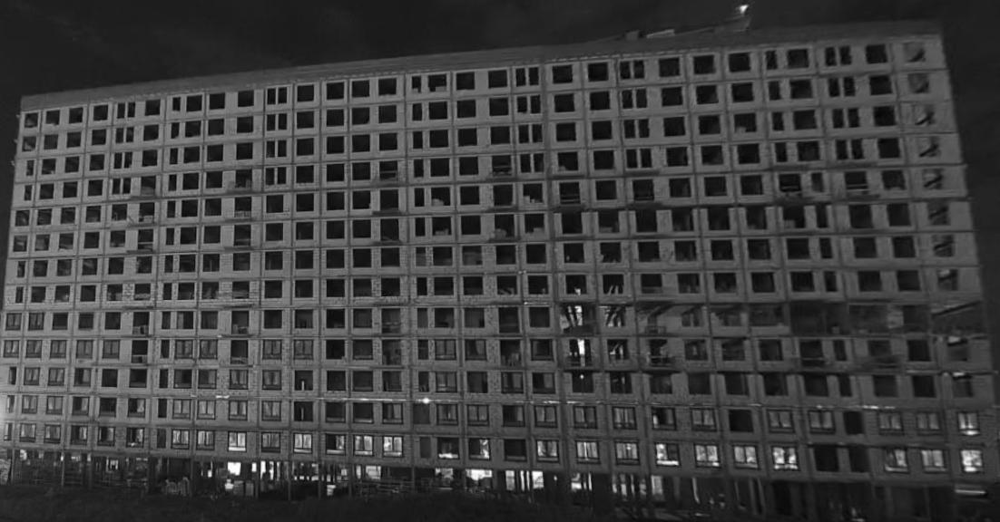

In [3]:
cv2_imshow(img)

In [4]:
pip install pycocotools


In [5]:
pip install layoutparser

In [6]:
from pycocotools.coco import COCO
import layoutparser as lp
import random
import cv2

In [7]:
def load_coco_annotations(annotations, coco=None):
    """
    Args:
        annotations (List):
            a list of coco annotaions for the current image
        coco (`optional`, defaults to `False`):
            COCO annotation object instance. If set, this function will
            convert the loaded annotation category ids to category names
            set in COCO.categories
    """
    layout = lp.Layout()

    for ele in annotations:

        x, y, w, h = ele['bbox']

        layout.append(
            lp.TextBlock(
                block = lp.Rectangle(x, y, w+x, h+y),
                type  = ele['category_id'] if coco is None else coco.cats[ele['category_id']]['name'],
                id = ele['id']
            )
        )

    return layout

In [8]:
COCO_ANNO_PATH = '/content/drive/MyDrive/urbancode/urbanhack-train/annotations/instances_default.json'
COCO_IMG_PATH  = '/content/drive/MyDrive/urbancode/urbanhack-train/images'

coco = COCO(COCO_ANNO_PATH)

loading annotations into memory...
Done (t=0.72s)
creating index...
index created!


In [10]:
coco.imgs

{1: {'id': 1,
  'width': 854,
  'height': 572,
  'file_name': '0000019949building.jpg',
  'license': 0,
  'flickr_url': '',
  'coco_url': '',
  'date_captured': 0},
 2: {'id': 2,
  'width': 881,
  'height': 720,
  'file_name': '0000019869building.jpg',
  'license': 0,
  'flickr_url': '',
  'coco_url': '',
  'date_captured': 0},
 3: {'id': 3,
  'width': 847,
  'height': 544,
  'file_name': '0000019458building.jpg',
  'license': 0,
  'flickr_url': '',
  'coco_url': '',
  'date_captured': 0},
 4: {'id': 4,
  'width': 303,
  'height': 600,
  'file_name': '0000019455building.jpg',
  'license': 0,
  'flickr_url': '',
  'coco_url': '',
  'date_captured': 0},
 5: {'id': 5,
  'width': 869,
  'height': 676,
  'file_name': '0000019431building.jpg',
  'license': 0,
  'flickr_url': '',
  'coco_url': '',
  'date_captured': 0},
 6: {'id': 6,
  'width': 868,
  'height': 632,
  'file_name': '0000019236building.jpg',
  'license': 0,
  'flickr_url': '',
  'coco_url': '',
  'date_captured': 0},
 7: {'id':

<ipython-input-16-eff5d8ba0d22>:9: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  for image_id in random.sample(coco.imgs.keys(), 1):


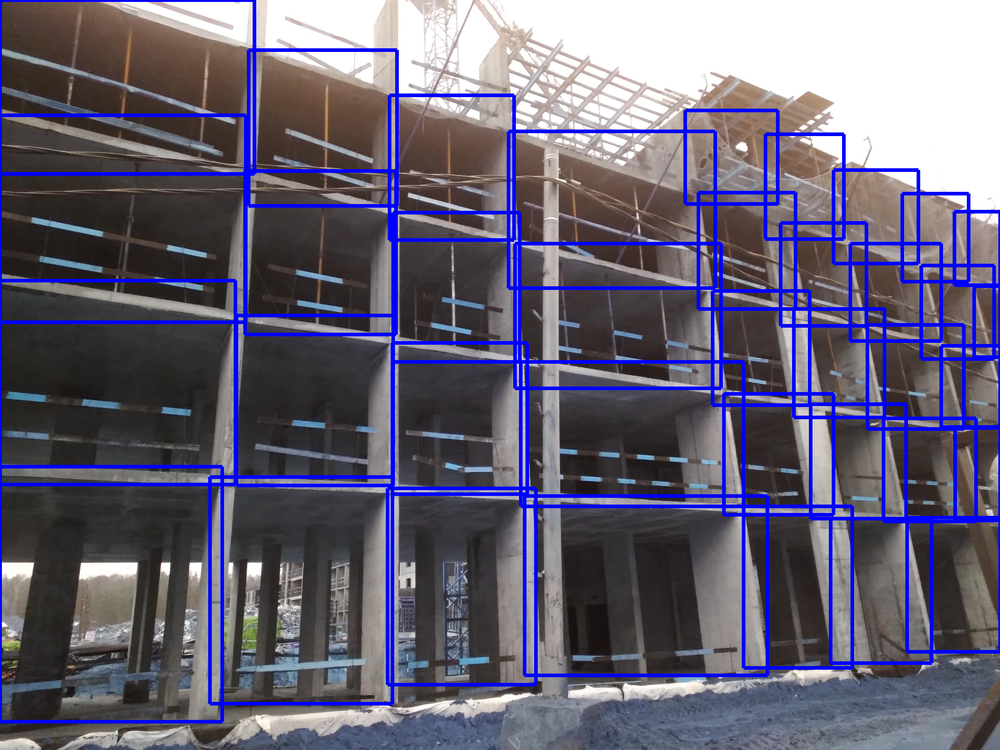

In [16]:
color_map = {
    'window':   'red',
    'empty':  'blue',
    'filled':   'green',
}



for image_id in random.sample(coco.imgs.keys(), 1):
    image_info = coco.imgs[image_id]
    annotations = coco.loadAnns(coco.getAnnIds([image_id]))

    image = cv2.imread(f'{COCO_IMG_PATH}/{image_info["file_name"]}')
    layout = load_coco_annotations(annotations, coco)

    viz = lp.draw_box(image, layout, color_map=color_map)
    display(viz) # show the results

